# Detecting Cancer Metastases on Gigapixel Pathology Images
COMS W4995 Course Final Project

Fan Wu

#Data and Processing
Necessary Import and Installation

In [ ]:
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
from google.colab import drive
import random
import os, shutil
import pathlib
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Import Slides

19 slides in total, randomly choosing 3 for testing, 2 for validation, the rest 14 slides will be training

In [ ]:
base_dir = pathlib.Path('/content/drive/MyDrive/Fall 2020/Data/')
all_list = sorted(list(base_dir.glob('*.tif')))
mask_list = sorted(list(base_dir.glob('*mask.tif')))
slide_list = sorted(list(set(all_list)-set(mask_list)))

In [ ]:
def convert_path(slide_list):
  temp = []
  for i in slide_list:
    j = str(i).split('.')[0]
    k = j + "_mask.tif"
    temp.append(k)
  return temp

There are 19 slides in total.

In [ ]:
len(slide_list)

19

In [ ]:
random.Random(7).shuffle(slide_list)
train_list = slide_list[:14]
validation_list = slide_list[14:16]
test_list = slide_list[-3:]

train_mask = convert_path(train_list)
test_mask = convert_path(test_list)
validation_mask = convert_path(validation_list)

assert len(train_list) == len(train_mask)
assert len(validation_list) == len(validation_mask)
assert len(test_list) == len(test_mask)

In [ ]:
train_list

[PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_064.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_005.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_096.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_094.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_031.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_023.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_091.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_012.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_001.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_057.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_019.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_081.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_035.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_078.tif')]

Slide 064.tif, 005.tif, 096.tif, 094.tif, 031.tif, 023.tif, 091.tif, 012.tif, 001.tif, 057.tif, 019.tif, 081.tif, 035.tif, 078.tif will be used for training.

In [ ]:
validation_list

[PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_084.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_002.tif')]

Slide 084.tif, 002.tif will be used as validation set.

In [ ]:
test_list

[PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_075.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_016.tif'),
 PosixPath('/content/drive/MyDrive/Fall 2020/Data/tumor_059.tif')]

Slide 075.tif, 016.tif, 059.tif will be used for prediction and evaluation.

##Data Visualization

Using '001.tif' for visulization

In [ ]:
base_dir = '/content/drive/MyDrive/Fall 2020/Data/'
slide_path = base_dir + 'tumor_001.tif'
tumor_mask_path = base_dir + 'tumor_001_mask.tif'

Read in slide 001.tif first:

In [ ]:
slide = open_slide(slide_path)
print ("Read WSI from %s with width: %d, height: %d" % (slide_path, slide.level_dimensions[0][0], slide.level_dimensions[0][1]))

tumor_mask = open_slide(tumor_mask_path)
print ("Read tumor mask from %s" % (tumor_mask_path))

print("Slide includes %d levels", len(slide.level_dimensions))
for i in range(tumor_mask.level_count):
  print("Level %d, dimensions: %s downsample factor %d" % (i, slide.level_dimensions[i], slide.level_downsamples[i]))
  assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
  assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

Read WSI from /content/drive/MyDrive/Fall 2020/Data/tumor_001.tif with width: 97792, height: 221184
Read tumor mask from /content/drive/MyDrive/Fall 2020/Data/tumor_001_mask.tif
Slide includes %d levels 10
Level 0, dimensions: (97792, 221184) downsample factor 1
Level 1, dimensions: (48896, 110592) downsample factor 2
Level 2, dimensions: (24448, 55296) downsample factor 4
Level 3, dimensions: (12224, 27648) downsample factor 8
Level 4, dimensions: (6112, 13824) downsample factor 16
Level 5, dimensions: (3056, 6912) downsample factor 32
Level 6, dimensions: (1528, 3456) downsample factor 64
Level 7, dimensions: (764, 1728) downsample factor 128
Level 8, dimensions: (382, 864) downsample factor 256


Necessary functions to read slides and show images

In [ ]:
def read_slide(slide, x, y, level, width, height, as_float=False):
  im = slide.read_region((x,y), level, (width, height))
  im = im.convert('RGB')
  if as_float:
      im = np.asarray(im, dtype=np.float32)
  else:
      im = np.asarray(im)
  assert im.shape == (height, width, 3)
  return im

In [ ]:
def show_image(slide, tumor_mask, x, y, level, width, height):
  slide_image = read_slide(slide, x = x, y = y, level = level, width = width, height = height)
  mask_image = read_slide(tumor_mask, x = x, y = y, level = level, width = width, height = height)
  mask_image = mask_image[:,:,0]
  return slide_image, mask_image

Visualization

The original image with tissue, no tumor showing.

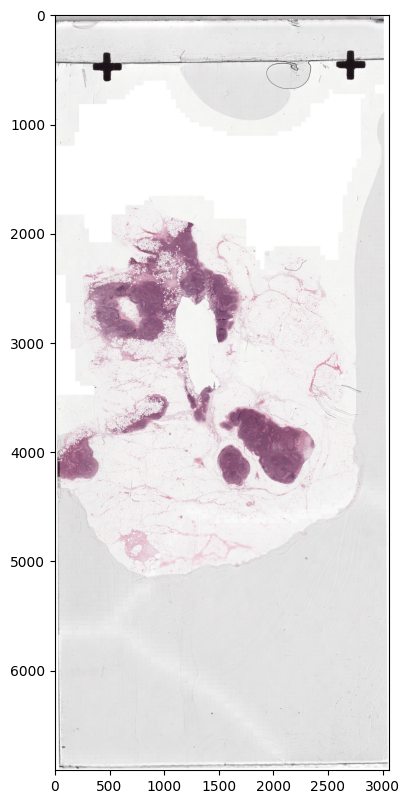

In [ ]:
slide_image, mask_image = show_image(slide, tumor_mask, 0, 0, 5, slide.level_dimensions[5][0], slide.level_dimensions[5][1])
plt.figure(figsize = (200,10), dpi = 100)
plt.imshow(slide_image);

The mask of 001.tif image

It is essentially a heatmap with tumor region being highlighted.

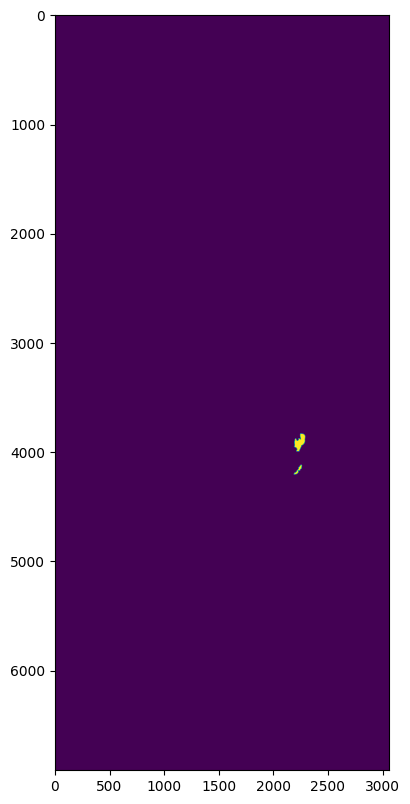

In [ ]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(mask_image)

Overlay the original image and the mask

The tumor region is in red.

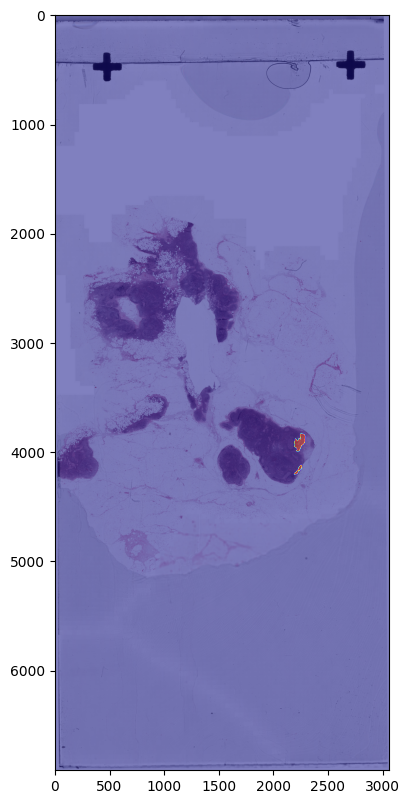

In [ ]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)
plt.imshow(mask_image, cmap='jet', alpha=0.5)

## Preprocessing

Functions to find tissue pixels and tumor pixels

In [ ]:
def find_tissue_pixels(image, intensity=0.8):
  im_gray = rgb2gray(image)
  assert im_gray.shape == (image.shape[0], image.shape[1])
  indices = np.where(im_gray <= intensity)
  return list(zip(indices[0], indices[1]))

In [ ]:
def apply_mask(im, mask, color=(255,0,0)):
  masked = np.copy(im)
  for x,y in mask: masked[x][y] = color
  return masked

In [ ]:
def find_tumor_pixel(image):
  return [(j, i) for i, m in enumerate(image) for j, n in enumerate(m) if n]

Functions to generate patches from each slide

In [ ]:
def patch(slide, tumor_mask, i, j, level, level_new, width, height):
  slide_patch = read_slide(slide = slide, 
                           x = int(i*int(slide.level_downsamples[level]) - (width//2)*int(slide.level_downsamples[level_new])), 
                           y = int(j*int(slide.level_downsamples[level]) - (height//2)*int(slide.level_downsamples[level_new])), 
                           level = level_new,  
                           width = width,
                           height = height)
  mask_patch = read_slide(slide = tumor_mask, 
                          x = i*int(tumor_mask.level_downsamples[level]) - (width//2)*int(tumor_mask.level_downsamples[level_new]), 
                          y = j*int(tumor_mask.level_downsamples[level]) - (height//2)*int(tumor_mask.level_downsamples[level_new]), 
                          level = level_new, 
                          width = width,
                          height = height)
  return slide_patch, mask_patch

In [ ]:
def generate_patch(slide, tumor_mask):
  level_2 = []
  level_3 = []
  label = []
  slide_image, mask_image = show_image(slide, tumor_mask, 0, 0, 5, slide.level_dimensions[5][0], slide.level_dimensions[5][1])
  tissue_list = find_tissue_pixels(slide_image)
  tumor_list = find_tumor_pixel(mask_image)
  normal_list = list(set(tissue_list) - set(tumor_list))
  number_tumor = min(200, len(tumor_list)//2)
  sample_tumor = random.sample(tumor_list, number_tumor)
  for (i, j) in sample_tumor:
    level_2.append(patch(slide, tumor_mask, i, j, 5, 2, 299, 299)[0])
    level_3.append(patch(slide, tumor_mask, i, j, 5, 3, 299, 299)[0])
    label.append(1)

  count = 0
  sample_normal = random.sample(normal_list, number_tumor)
  while count < number_tumor:
    center_mask = patch(slide, tumor_mask, sample_normal[count][1], sample_normal[count][0], 5, 5, 128, 128)[1]
    if np.sum(center_mask) is 0:
      x, y = sample_normal[count][0], sample_normal[count][1]
    else:
      new_pixel = random.choice(normal_list)
      while new_pixel in sample_normal:
        new_pixel = random.choice(normal_list)
      x, y = new_pixel[0], new_pixel[1]
    level_2.append(patch(slide, tumor_mask, y, x, 5, 2, 299, 299)[0])
    level_3.append(patch(slide, tumor_mask, y, x, 5, 3, 299, 299)[0])
    label.append(0)
    count = count + 1
  return level_2, level_3, label

Saving Generated Patches

All training patches will be saved to 'Train' folder whereas all validation patches will be saved to 'Validate' folder. Patches for testing will be generated in notebook for modeling, and they will not be generated randomly. 

The 'saving' function will take in the patches generated and save them into respective folders.

In [ ]:
saving_path_train = '/content/drive/MyDrive/Fall 2020/Data/Project Data/Train'
saving_path_valid = '/content/drive/MyDrive/Fall 2020/Data/Project Data/Validate'

def saving(level_2, level_3, label, saving_path_train, saving_path_valid, name):
  suffix = str(name).split('.')[0][-2:]
  level_2_1 = np.array(level_2)
  level_3_1 = np.array(level_3)
  label_1 = np.array(label)
  new_name_2 = 'level2_'+suffix+'.npy'
  new_name_3 = 'level3_'+suffix+'.npy'
  new_name_label = 'label_'+suffix+'.npy'
  np.save(os.path.join(saving_path_train, new_name_2), level_2_1)
  np.save(os.path.join(saving_path_train, new_name_3), level_3_1)
  np.save(os.path.join(saving_path_valid, new_name_label), label_1)

For all the slides in training set and validation set will be parsed in the following for loops for generating patches randomly. All the data will then be saved into two folders.

In [ ]:
for i in range(len(train_list)):
  slide = open_slide(str(train_list[i]))
  tumor_mask = open_slide(str(train_mask[i]))
  level_2, level_3, label = generate_patch(slide, tumor_mask)
  saving(level_2, level_3, label, saving_path_train, saving_path_valid, str[i])

In [ ]:
for i in range(len(validation_list)):
  slide = open_slide(str(validation_list[i]))
  tumor_mask = open_slide(str(validation_mask[i]))
  level_2, level_3, label = generate_patch(slide, tumor_mask)
  saving(level_2, level_3, label, saving_path_train, saving_path_valid, str[i])

## Patch Samples from 001.tif

For demonstration purposed, I previously saved some patches generated from slide 001.tif and its mask in my drive.

I will now load the sample data set and display some patches generated.

In [ ]:
sample_001_level2 = np.load('/content/drive/MyDrive/Fall 2020/Data/Project Data/Train/level2.npy')
sample_001_level2_mask = np.load('/content/drive/MyDrive/Fall 2020/Data/Project Data/Train/level2_mask.npy')
sample_001_level3 = np.load('/content/drive/MyDrive/Fall 2020/Data/Project Data/Train/level3.npy')
sample_001_level3_mask = np.load('/content/drive/MyDrive/Fall 2020/Data/Project Data/Train/level3_mask.npy')

Now showing a patch with tumor region at level 2.

First showing the original image, then its corresponding mask, and lastly their overlay image.

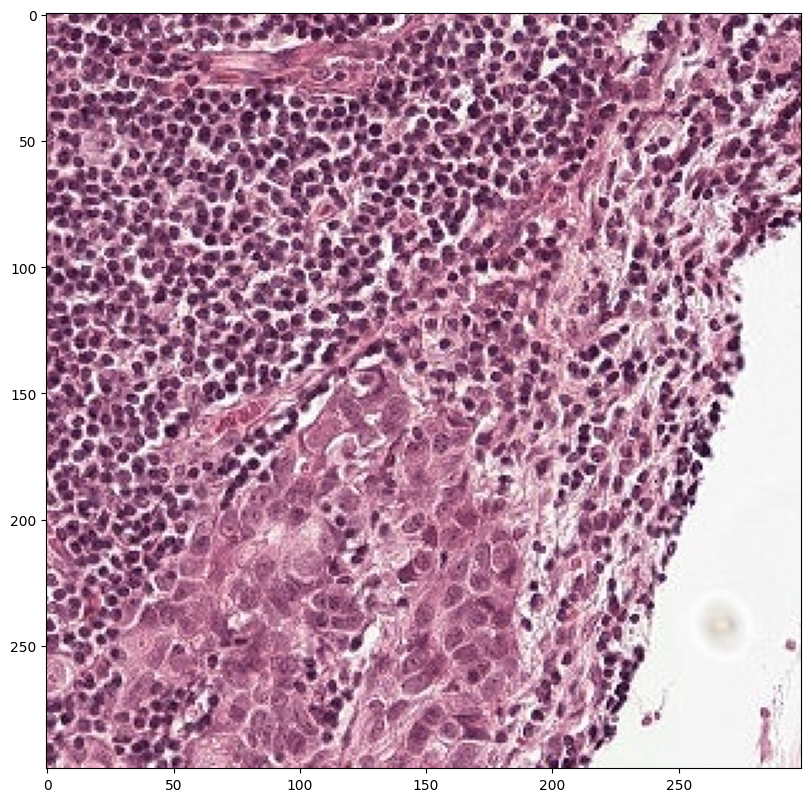

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level2[0])

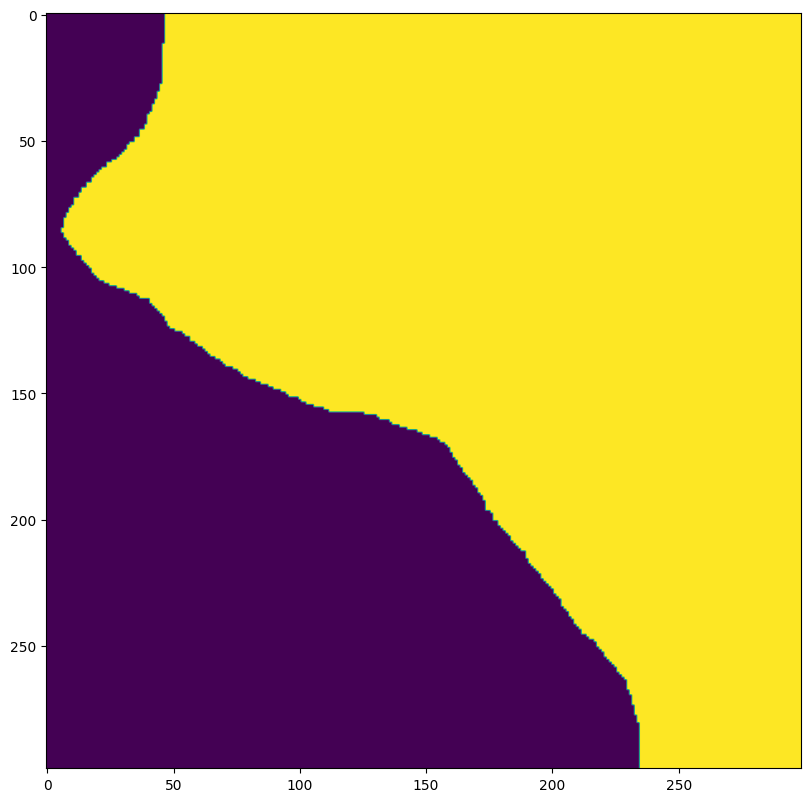

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level2_mask[0][:, :, 0])

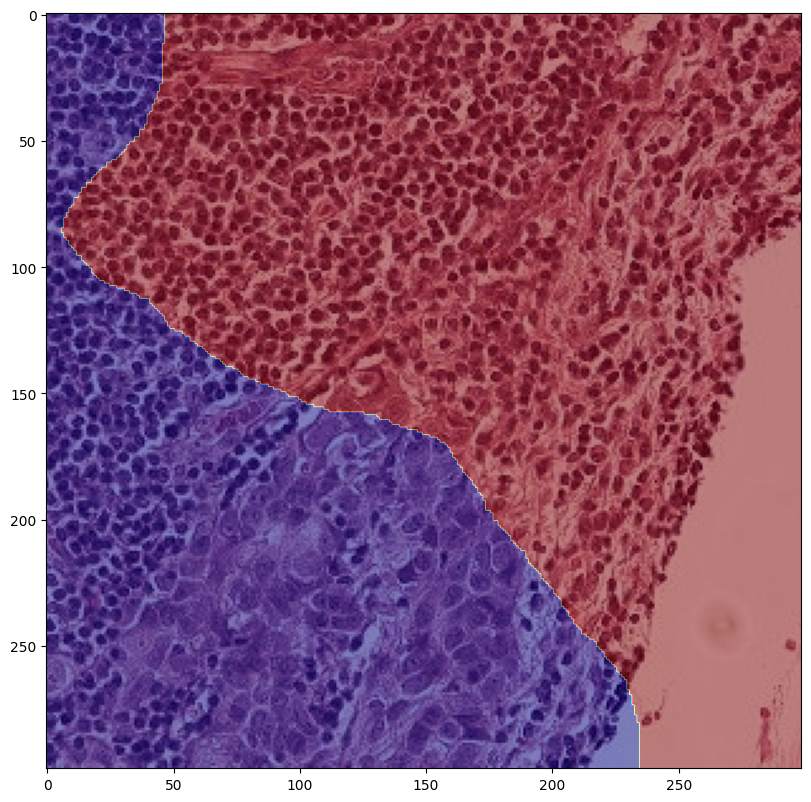

In [ ]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(sample_001_level2[0])
plt.imshow(sample_001_level2_mask[0][:, :, 0], cmap='jet', alpha=0.5)

The same patch at level 3.

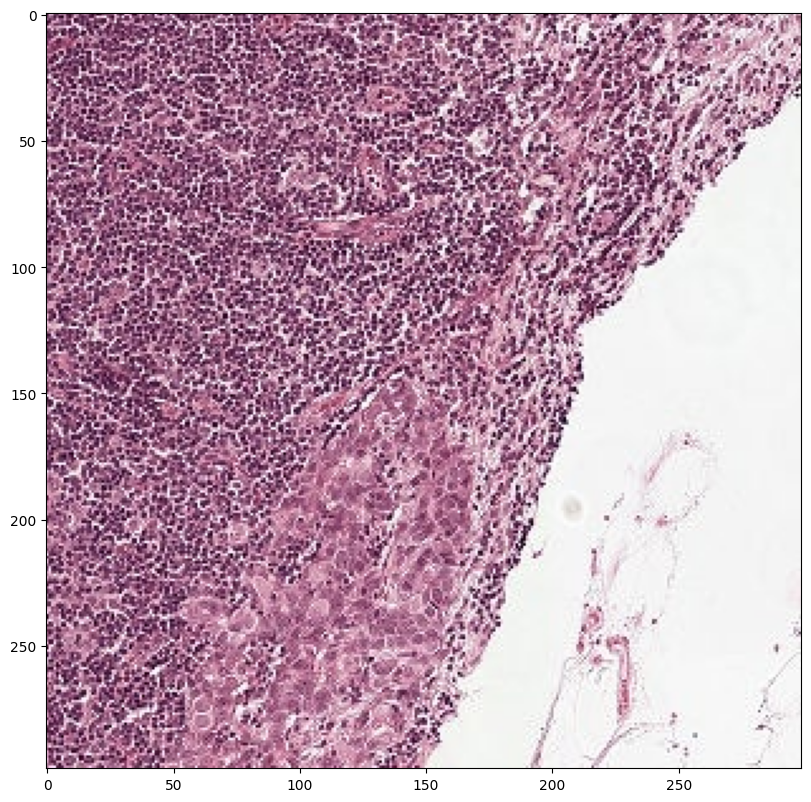

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level3[0])

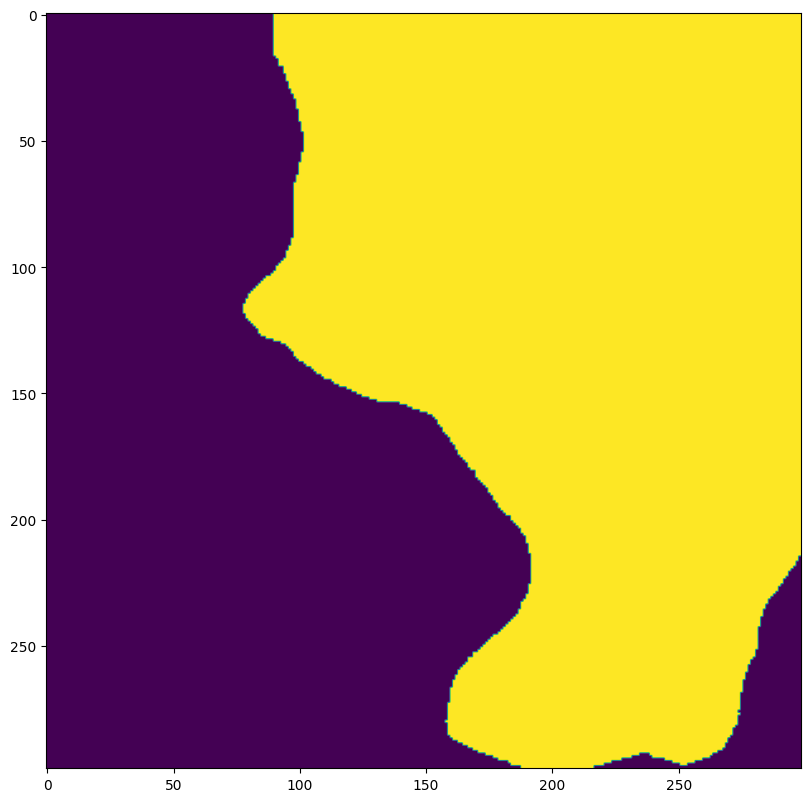

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level3_mask[0][:, :, 0])

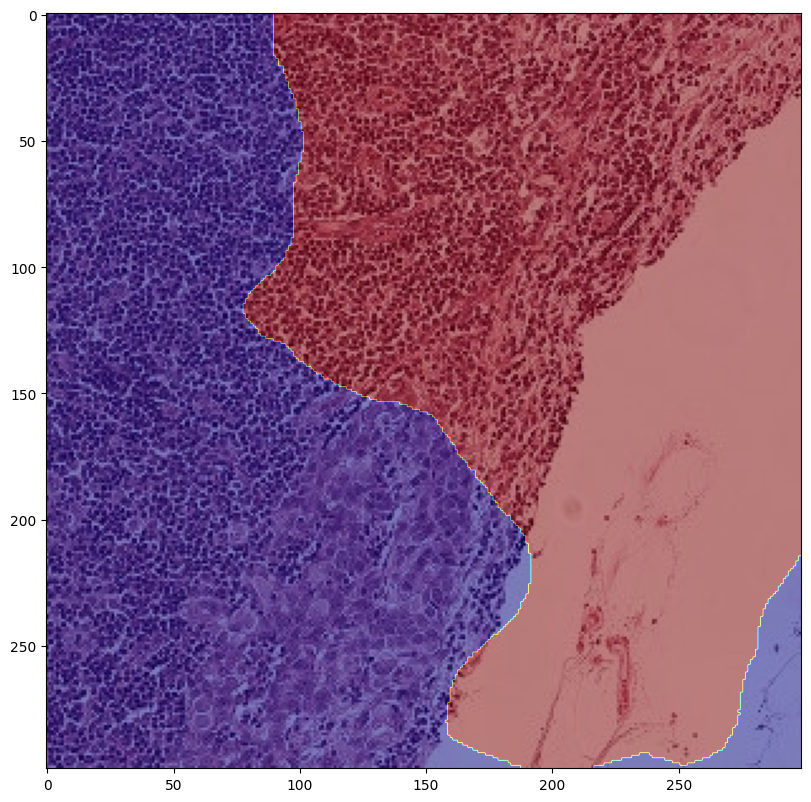

In [ ]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(sample_001_level3[0])
plt.imshow(sample_001_level3_mask[0][:, :, 0], cmap='jet', alpha=0.5)

A patch from level 2 but without any tumor region.

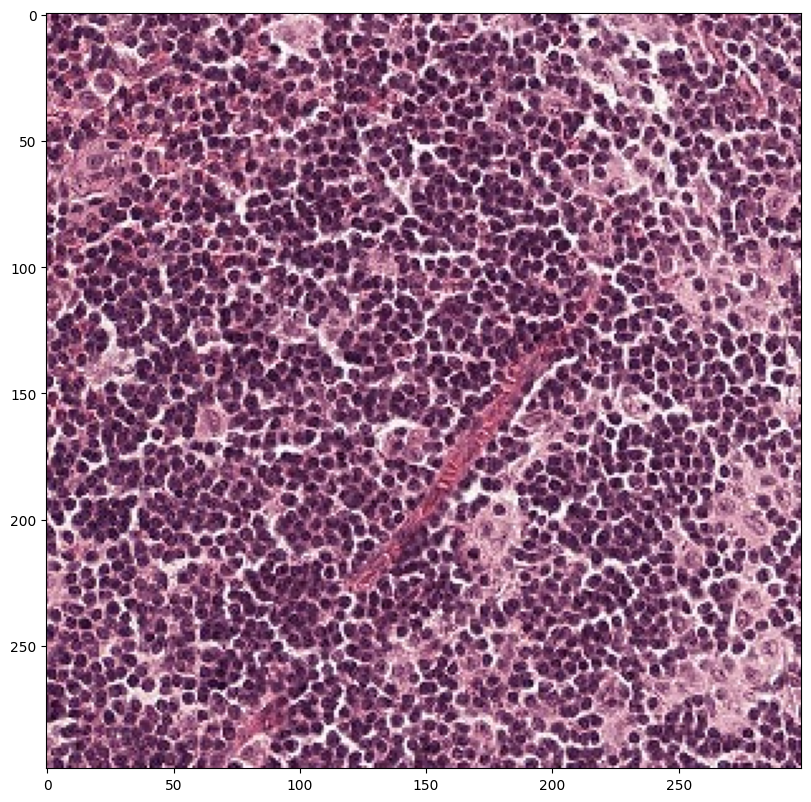

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level2[-1])

The mask confirms that there is indeed no tumor tissue in this patch.

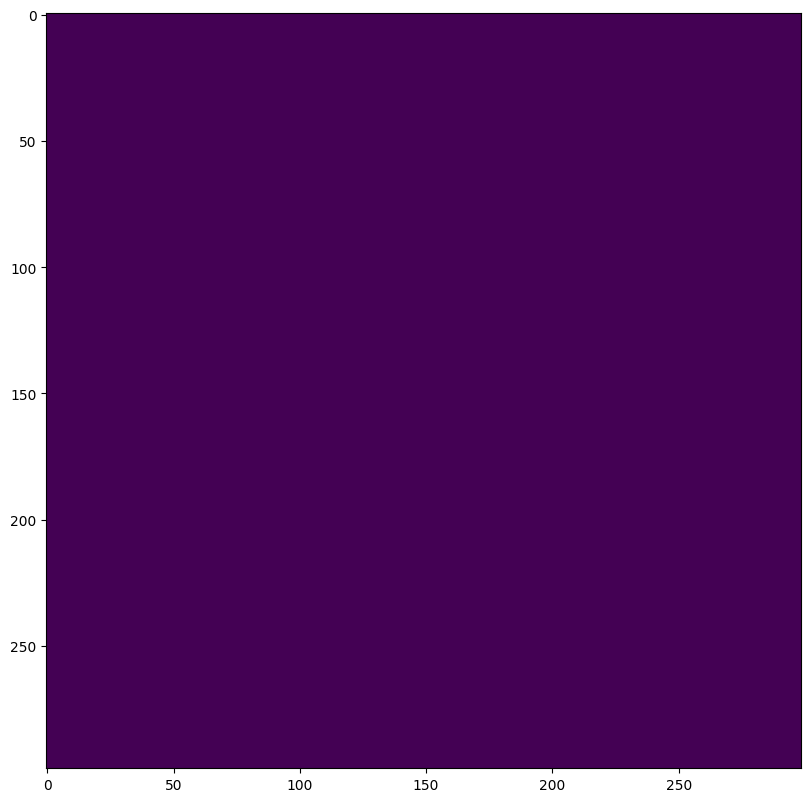

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level2_mask[-1][:, :, 0])

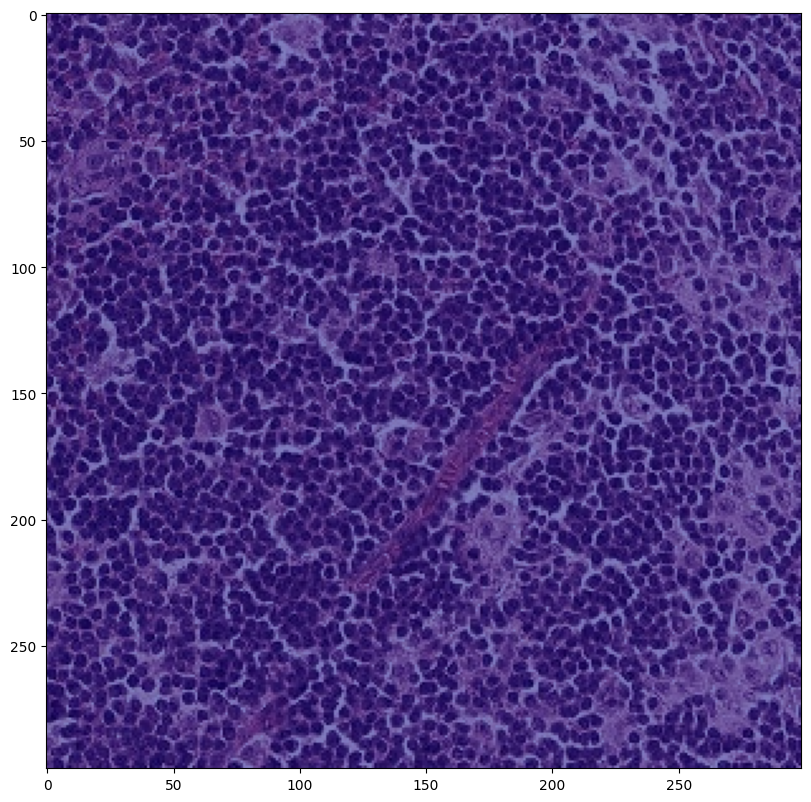

In [ ]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(sample_001_level2[-1])
plt.imshow(sample_001_level2_mask[-1][:, :, 0], cmap='jet', alpha=0.5)

The same patch at level 3.

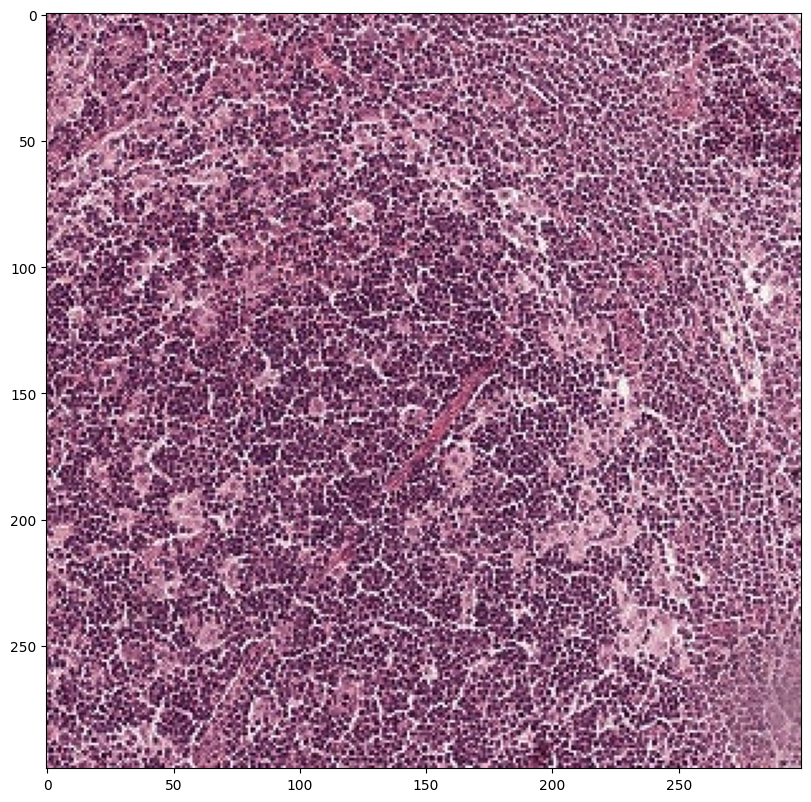

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level3[-1])

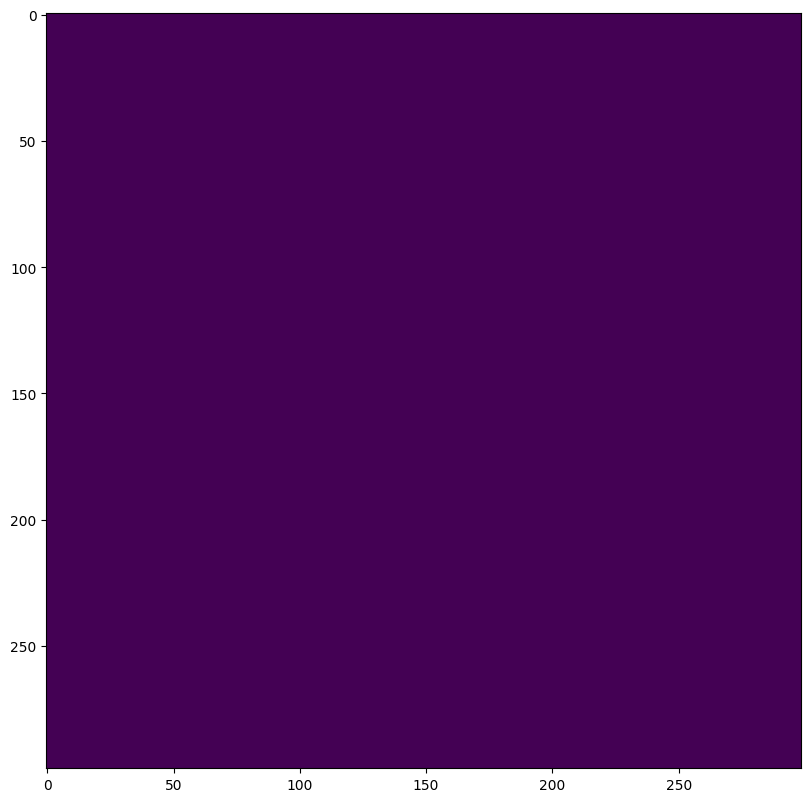

In [ ]:
plt.figure(figsize = (10,10), dpi = 100)
plt.imshow(sample_001_level3_mask[-1][:, :, 0])

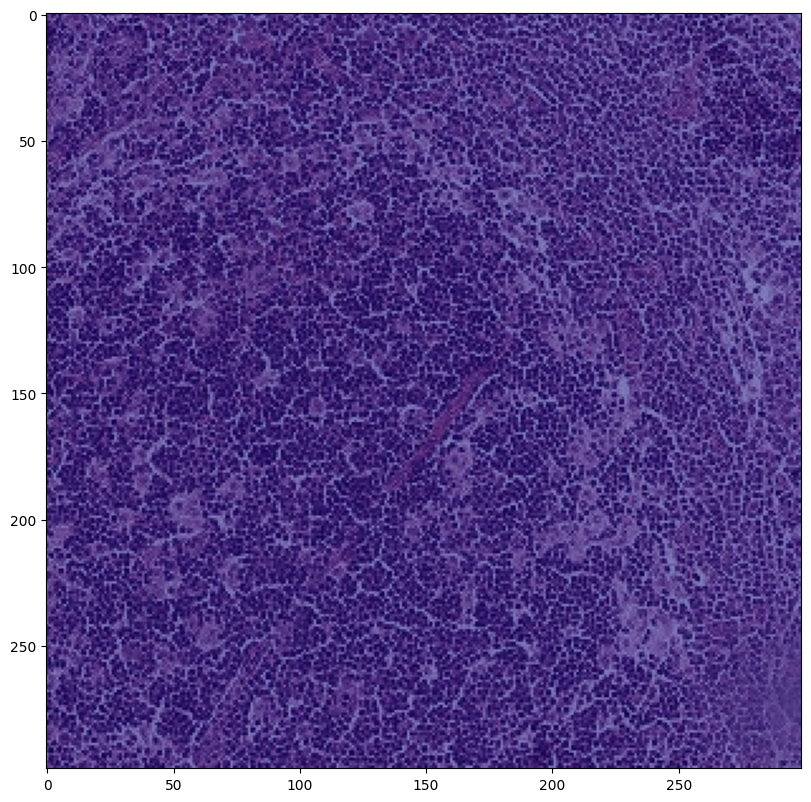

In [ ]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(sample_001_level3[-1])
plt.imshow(sample_001_level3[-1][:, :, 0], cmap='jet', alpha=0.5)

End